# Built-up area mapping using Sentinel-1 SAR data
## CE 778-2025-2 | Microwave Remote Sensing: Principles and Applications in Civil Engineering
### Mini project
#### Name: Manish J || Roll No.: 25M0612

In [1]:
# A FUNCTION TO EXECUTE  ALL THE PROCESS SINCE SAME PROCESSES HAVE TO BE DONE WITH BOTH ASCENDING AND DESCENDING PASSES FOR ACCURACY.

def process_sar(file_path, subswath, roi_barcelona, dem_path, output_folder, prefix):
    from esa_snappy import ProductIO, GPF, HashMap
    from jpy import get_type
    import numpy as np
    import rasterio
    from rasterio.transform import from_bounds
    from rasterio.windows import from_bounds as win_bounds
    from skimage.transform import resize
    import matplotlib.pyplot as plt
    import os
    import shapely.wkt
    os.makedirs(output_folder, exist_ok=True)

    print("> FUNCTION STARTED")
    
    # LOAD
    product = ProductIO.readProduct(file_path)
    print("process Load done")

    # SPLIT
    params = HashMap()
    params.put('subswath', subswath)
    params.put('selectedPolarisations', 'VV,VH')
    split = GPF.createProduct('TOPSAR-Split', params, product)
    print("process Split done")

    # ORBIT
    params = HashMap()
    params.put('orbitType', 'Sentinel Precise (Auto Download)')
    orbit = GPF.createProduct('Apply-Orbit-File', params, split)
    print("process Orbit done")

    # CALIBRATION
    Boolean = get_type('java.lang.Boolean')
    params = HashMap()
    params.put('outputImageInComplex', Boolean(True))
    params.put('selectedPolarisations', 'VV,VH')
    cal = GPF.createProduct('Calibration', params, orbit)
    print("process Calibration done")

    # DEBURST
    params = HashMap()
    params.put('selectedPolarisations', 'VV,VH')
    deburst = GPF.createProduct('TOPSAR-Deburst', params, cal)
    print("process Deburst done")

    # C2
    params = HashMap()
    params.put('matrix', 'C2')
    c2 = GPF.createProduct('Polarimetric-Matrices', params, deburst)
    print("process C2 matrix done")

    # MULTILOOK
    Integer = get_type('java.lang.Integer')
    params = HashMap()
    params.put('nRgLooks', Integer(4))
    params.put('nAzLooks', Integer(1))
    ml = GPF.createProduct('Multilook', params, c2)
    print("process Multilook done")

    # TERRAIN CORRECTION
    parameters = HashMap()
    parameters.put('demName', 'SRTM 1Sec HGT')
    parameters.put('pixelSpacingInMeter', 10.0)
    parameters.put('mapProjection', 'WGS84(DD)')
    parameters.put('nodataValueAtSea', False)
    parameters.put('saveSelectedSourceBand', True)
    tc_product = GPF.createProduct('Terrain-Correction', parameters, ml)
    print("process Terrain Correction done")

    # SUBSET
    PixelPos = get_type('org.esa.snap.core.datamodel.PixelPos')
    GeoPos   = get_type('org.esa.snap.core.datamodel.GeoPos')

    geo = tc_product.getSceneGeoCoding()
    H = tc_product.getSceneRasterHeight()
    W = tc_product.getSceneRasterWidth()

    gp = GeoPos()
    geo.getGeoPos(PixelPos(0, 0), gp)
    lat_ul, lon_ul = gp.lat, gp.lon

    geo.getGeoPos(PixelPos(W-1, H-1), gp)
    lat_lr, lon_lr = gp.lat, gp.lon

    roi_geom = shapely.wkt.loads(roi_barcelona)
    minx, miny, maxx, maxy = roi_geom.bounds

    def read_subset_band(prod, band_name):
        band = prod.getBand(band_name)
        Wb, Hb = band.getRasterWidth(), band.getRasterHeight()

        transform = from_bounds(lon_ul, lat_lr, lon_lr, lat_ul, Wb, Hb)
        window = win_bounds(minx, miny, maxx, maxy, transform=transform)

        r0, r1 = int(window.row_off), int(window.row_off + window.height)
        c0, c1 = int(window.col_off), int(window.col_off + window.width)

        arr = np.zeros((r1-r0)*(c1-c0), np.float32)
        band.readPixels(c0, r0, c1-c0, r1-r0, arr)

        return arr.reshape(r1-r0, c1-c0)
    print("process Subset done")


    # STOKES (PYTHON)
    C11 = read_subset_band(tc_product, 'C11')
    C22 = read_subset_band(tc_product, 'C22')
    C12_real = read_subset_band(tc_product, 'C12_real')
    C12_imag = read_subset_band(tc_product, 'C12_imag')

    g0 = C11 + C22
    g1 = C11 - C22
    g2 = 2 * C12_real
    g3 = 2 * C12_imag
    print("process Stokes Elements done")

    # MAGNITUDES
    g1_abs = np.abs(g1)
    g2_abs = np.abs(g2)
    g3_abs = np.abs(g3)
    print("process Magnitude done")

    # OUTLIER HANDLING
    def outlier(x):
        p5, p95 = np.percentile(x, 5), np.percentile(x, 95)
        return np.clip(x, p5, p95)
    
    g1_clip = outlier(g1_abs)
    g2_clip = outlier(g2_abs)
    g3_clip = outlier(g3_abs)

    # NORMALIZATION
    g1n = g1_clip / (g1_clip.max() + 1e-10)
    g2n = g2_clip / (g2_clip.max() + 1e-10)
    g3n = g3_clip / (g3_clip.max() + 1e-10)
    print("process Outlier Handling done")
    
    # SLOPE
    lat_min, lat_max = min(lat_ul, lat_lr), max(lat_ul, lat_lr)
    lon_min, lon_max = min(lon_ul, lon_lr), max(lon_ul, lon_lr)

    with rasterio.open(dem_path) as src:
        win = win_bounds(lon_min, lat_min, lon_max, lat_max, transform=src.transform)
        dem = src.read(1, window=win).astype(np.float32)
        transform = src.window_transform(win)
    dx = transform[0] * 111320
    dy = -transform[4] * 111320
    dz_dx = np.gradient(dem, axis=1) / dx
    dz_dy = np.gradient(dem, axis=0) / dy
    slope = np.degrees(np.arctan(np.sqrt(dz_dx**2 + dz_dy**2)))
    slope_resampled = resize(slope, g1n.shape, order=0, preserve_range=True)
    mask = slope_resampled < 15

    # SLOPE VISUALIZATION
    slope_binary = (slope < 15).astype(np.uint8)
    fig, ax = plt.subplots(1, 2, figsize=(10,5))
    im = ax[0].imshow(slope, cmap='terrain')
    ax[0].set_title("Slope (degrees)")
    cbar = fig.colorbar(im, ax=ax[0],fraction=0.03)
    cbar.set_label("Slope (degrees)")
    ax[1].imshow(slope_binary, cmap='gray')
    ax[1].set_title("Slope < 15°")
    for a in ax:
        a.axis('off')
    plt.tight_layout()
    plt.show()

    # MASKING
    g1m = np.where(mask, g1n, 0)
    g2m = np.where(mask, g2n, 0)
    g3m = np.where(mask, g3n, 0)
    print("process Masking done")

    # DPRBI & DoP
    DpRBI = np.sqrt((g1m**2 + g2m**2 + g3m**2)/3)
    DoP = np.sqrt(g1**2 + g2**2 + g3**2) / (g0 + 1e-10)
    # DoP = (DoP - DoP.min())/(DoP.max()-DoP.min()+1e-10)
    print("process DpRBI done")

    # VISUALIZATION
    def safe_log(x):
        return 10*np.log10(np.abs(x)+1e-10)
    fig, axs = plt.subplots(5,3, figsize=(18,22))
    axs[0,0].imshow(safe_log(g1)); axs[0,0].set_title("g1")
    axs[0,1].imshow(safe_log(g2)); axs[0,1].set_title("g2")
    axs[0,2].imshow(safe_log(g3)); axs[0,2].set_title("g3")

    axs[1,0].imshow(safe_log(g1_abs)); axs[1,0].set_title("|g1|")
    axs[1,1].imshow(safe_log(g2_abs)); axs[1,1].set_title("|g2|")
    axs[1,2].imshow(safe_log(g3_abs)); axs[1,2].set_title("|g3|")

    axs[2,0].imshow(g1n); axs[2,0].set_title("g1n")
    axs[2,1].imshow(g2n); axs[2,1].set_title("g2n")
    axs[2,2].imshow(g3n); axs[2,2].set_title("g3n")

    axs[3,0].imshow(g1m); axs[3,0].set_title("g1 masked")
    axs[3,1].imshow(g2m); axs[3,1].set_title("g2 masked")
    axs[3,2].imshow(g3m); axs[3,2].set_title("g3 masked")

    axs[4,0].imshow(DoP); axs[4,0].set_title("DoP")
    axs[4,1].imshow(DpRBI); axs[4,1].set_title("DpRBI")
    for ax in axs.flat:
        ax.axis('off')
    plt.tight_layout()
    plt.show()
    
    def print_range(name, arr):
        print(f"{name}:")
        print(f"  Min = {np.min(arr):.4f}")
        print(f"  Max = {np.max(arr):.4f}")
        print(f"  Mean = {np.mean(arr):.4f}")
        print(f"  Std  = {np.std(arr):.4f}")
        print(f"  P5   = {np.percentile(arr,5):.4f}")
        print(f"  P95  = {np.percentile(arr,95):.4f}")
        print()
    print_range("g1", g1)
    print_range("g2", g2)
    print_range("g3", g3)
    
    print_range("|g1|", g1_abs)
    print_range("|g2|", g2_abs)
    print_range("|g3|", g3_abs)

    
    # EXPORT
    transform = from_bounds(lon_ul, lat_lr, lon_lr, lat_ul, g1.shape[1], g1.shape[0])
    crs = {'proj':'longlat','datum':'WGS84'}

    def save(name, arr):
        path = os.path.join(output_folder, f"{prefix}_{name}.tif")
        with rasterio.open(path,'w',driver='GTiff',
                           height=arr.shape[0], width=arr.shape[1],
                           count=1, dtype='float32',
                           crs=crs, transform=transform) as dst:
            dst.write(arr.astype('float32'),1)

    for name, arr in {
        "g1":g1, "g2":g2, "g3":g3,
        "g1_abs":g1_abs, "g2_abs":g2_abs, "g3_abs":g3_abs,
        "g1n":g1n, "g2n":g2n, "g3n":g3n,
        "g1m":g1m, "g2m":g2m, "g3m":g3m,
        "DoP":DoP, "DpRBI":DpRBI
    }.items():
        save(name, arr)

    print("> FUNCTION ENDED")

    return DpRBI

In [2]:
# common to both passes
roi_barcelona = 'POLYGON((2.0088418454953594 41.2882490036969, \
2.278693530065672 41.2882490036969, \
2.278693530065672 41.47372477597999, \
2.0088418454953594 41.47372477597999, \
2.0088418454953594 41.2882490036969))'
dem_path = r"C:\Sate\SRTM_30m_Barcelona.tif"
output_folder = r"D:\IITB Mini_projects\CE778\project\tif_exports_Barcelona2"

# pass specific
asc_path = r"C:\Sate\S1A_IW_SLC__1SDV_20241208T174712_20241208T174739_056904_06FD1C_B1E3.SAFE\manifest.safe"
desc_path = r"C:\Sate\S1A_IW_SLC__1SDV_20241207T060138_20241207T060205_056882_06FC39_BFF6.SAFE\manifest.safe"

> FUNCTION STARTED
process Load done
process Split done
process Orbit done
process Calibration done
process Deburst done
process C2 matrix done
process Multilook done
process Terrain Correction done
process Subset done
process Stokes Elements done
process Magnitude done
process Outlier Handling done


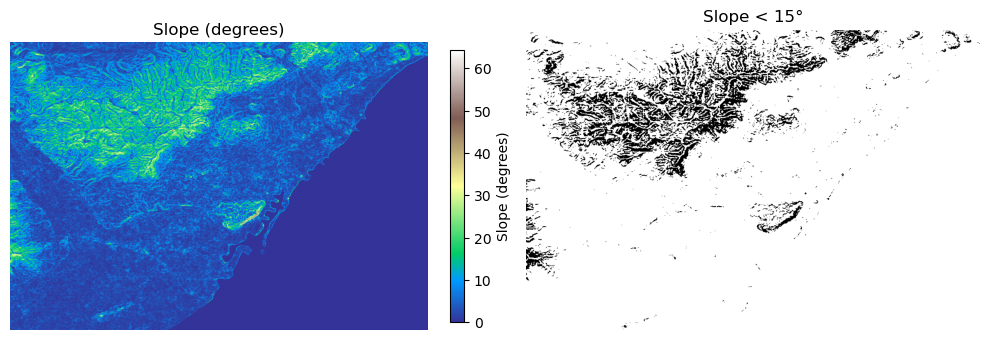

process Masking done
process DpRBI done


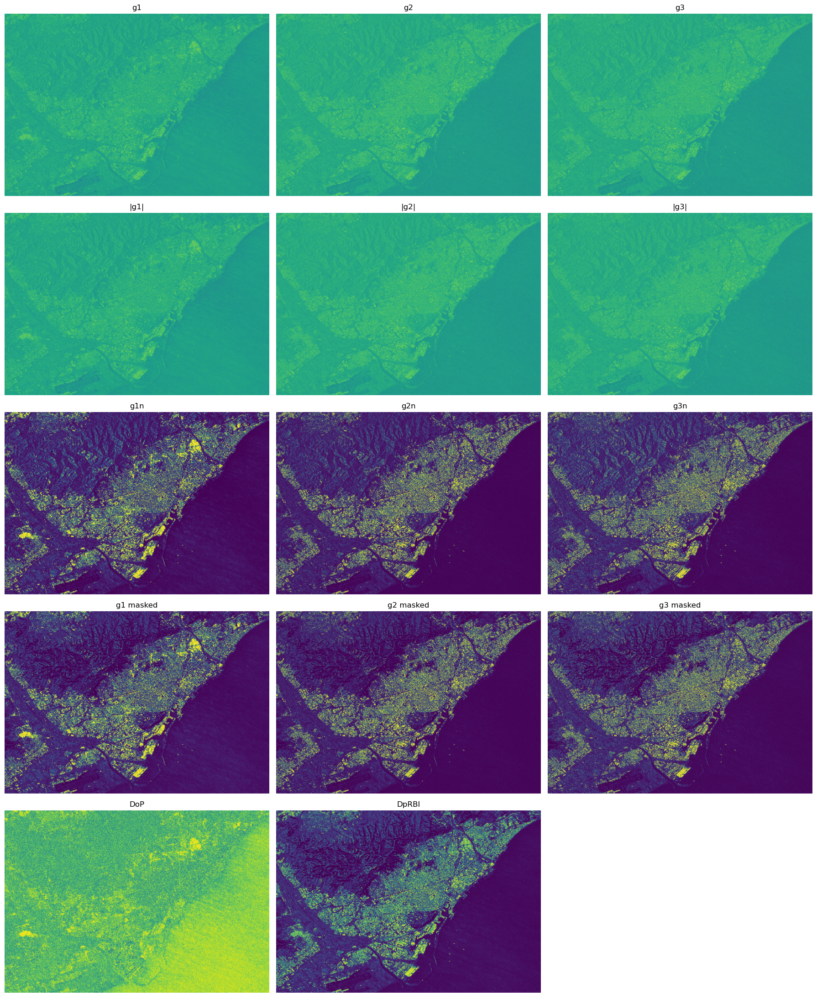

g1:
  Min = -203.7413
  Max = 1523.5087
  Mean = 0.2513
  Std  = 2.7082
  P5   = 0.0086
  P95  = 0.7323

g2:
  Min = -311.6863
  Max = 534.6180
  Mean = 0.0194
  Std  = 0.9226
  P5   = -0.1166
  P95  = 0.1842

g3:
  Min = -296.2777
  Max = 238.0692
  Mean = -0.0008
  Std  = 0.6200
  P5   = -0.1218
  P95  = 0.1171

|g1|:
  Min = 0.0000
  Max = 1523.5087
  Mean = 0.2578
  Std  = 2.7076
  P5   = 0.0107
  P95  = 0.7402

|g2|:
  Min = 0.0000
  Max = 534.6180
  Mean = 0.0916
  Std  = 0.9182
  P5   = 0.0009
  P95  = 0.2946

|g3|:
  Min = 0.0000
  Max = 296.2777
  Mean = 0.0662
  Std  = 0.6165
  P5   = 0.0009
  P95  = 0.2181

> FUNCTION ENDED


In [3]:
DpRBI_asc = process_sar(asc_path, 'IW2', roi_barcelona, dem_path, output_folder, 'ASC')

> FUNCTION STARTED
process Load done
process Split done
process Orbit done
process Calibration done
process Deburst done
process C2 matrix done
process Multilook done
process Terrain Correction done
process Subset done
process Stokes Elements done
process Magnitude done
process Outlier Handling done


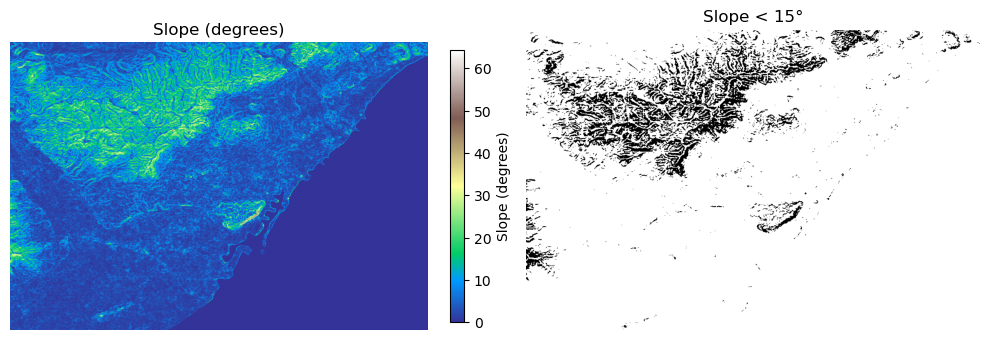

process Masking done
process DpRBI done


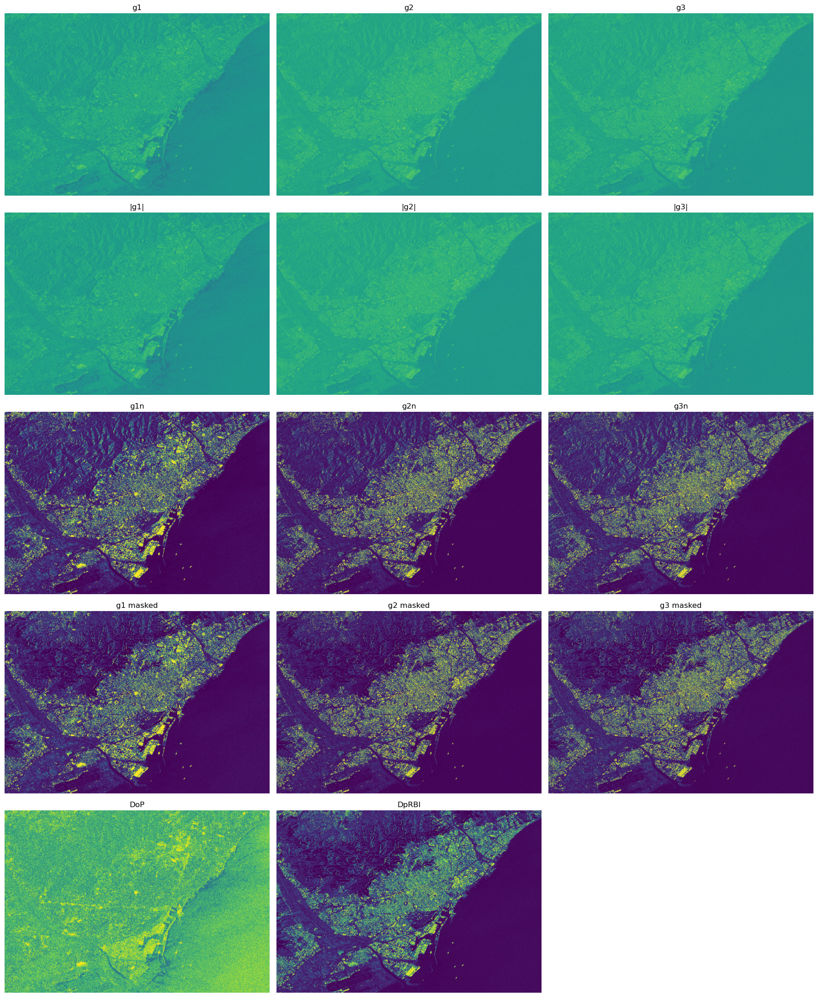

g1:
  Min = -2288.2102
  Max = 3814.5173
  Mean = 0.2746
  Std  = 7.1078
  P5   = 0.0049
  P95  = 0.7316

g2:
  Min = -758.2499
  Max = 1584.8232
  Mean = -0.0130
  Std  = 1.8128
  P5   = -0.1707
  P95  = 0.1317

g3:
  Min = -921.9425
  Max = 298.2718
  Mean = -0.0047
  Std  = 1.3884
  P5   = -0.1280
  P95  = 0.1198

|g1|:
  Min = 0.0000
  Max = 3814.5173
  Mean = 0.2867
  Std  = 7.1073
  P5   = 0.0067
  P95  = 0.7402

|g2|:
  Min = 0.0000
  Max = 1584.8232
  Mean = 0.0950
  Std  = 1.8103
  P5   = 0.0009
  P95  = 0.2936

|g3|:
  Min = 0.0000
  Max = 921.9425
  Mean = 0.0706
  Std  = 1.3867
  P5   = 0.0009
  P95  = 0.2236

> FUNCTION ENDED


In [4]:
DpRBI_desc = process_sar(desc_path, 'IW1', roi_barcelona, dem_path, output_folder, 'DESC')

In [5]:
print("ASC shape:", DpRBI_asc.shape)
print("DESC shape:", DpRBI_desc.shape)

ASC shape: (2065, 3004)
DESC shape: (2064, 3005)


In [6]:
import numpy as np
h = min(DpRBI_asc.shape[0], DpRBI_desc.shape[0])
w = min(DpRBI_asc.shape[1], DpRBI_desc.shape[1])
DpRBI_asc_c = DpRBI_asc[:h, :w]
DpRBI_desc_c = DpRBI_desc[:h, :w]
DpRBI_final = np.maximum(DpRBI_asc_c, DpRBI_desc_c)
print("process DpRBI computation done")

process DpRBI computation done


In [7]:
print("DpRBI shape: ", DpRBI_final.shape)

DpRBI shape:  (2064, 3004)


In [8]:
# Builtup map generation from DpRBI
# THRESHOLDING (1/sqrt(3))
threshold = 1 / np.sqrt(3)   # ≈ 0.577

builtup = (DpRBI_final >= threshold).astype(np.uint8)
print("process thresholding done")

process thresholding done


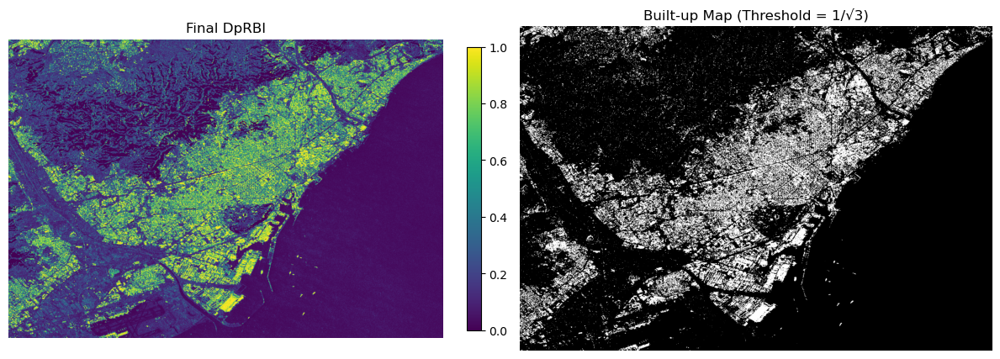

In [9]:
# VISUALIZATION
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(12, 6))
# DpRBI
im = ax[0].imshow(DpRBI_final, cmap='viridis')
ax[0].set_title("Final DpRBI")
ax[0].axis('off')
fig.colorbar(im, ax=ax[0], fraction=0.03)

# Built-up map
ax[1].imshow(builtup, cmap='gray')
ax[1].set_title("Built-up Map (Threshold = 1/√3)")
ax[1].axis('off')

plt.tight_layout()
plt.show()

In [10]:
# EXPORTING THE RESULTS
import os
import rasterio
from rasterio.transform import from_bounds

# ROI (Barcelona)
left   = 2.0088418454953594
right  = 2.278693530065672
bottom = 41.2882490036969
top    = 41.47372477597999

h, w = DpRBI_final.shape
transform = from_bounds(left, bottom, right, top, w, h)
crs = {'proj':'longlat','datum':'WGS84','no_defs':True}

output_folder = r"D:\IITB Mini_projects\CE778\project\tif_exports_Barcelona2"
os.makedirs(output_folder, exist_ok=True)

# DpRBI
with rasterio.open(
    f"{output_folder}\\DpRBI_final.tif",
    'w',
    driver='GTiff',
    height=h,
    width=w,
    count=1,
    dtype='float32',
    crs=crs,
    transform=transform
) as dst:
    dst.write(np.nan_to_num(DpRBI_final).astype('float32'), 1)

print("process save: DpRBI_final done")

# BUILT-UP MAP
with rasterio.open(
    f"{output_folder}\\BuiltUp_Map.tif",
    'w',
    driver='GTiff',
    height=h,
    width=w,
    count=1,
    dtype='uint8',
    crs=crs,
    transform=transform
) as dst:
    dst.write(builtup.astype('uint8'), 1)

print("process save: BuiltUp Map done")

process save: DpRBI_final done
process save: BuiltUp Map done
